<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Motivation" data-toc-modified-id="Motivation-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Motivation</a></span></li><li><span><a href="#Challenge" data-toc-modified-id="Challenge-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Challenge</a></span><ul class="toc-item"><li><span><a href="#Safety-Controls-and-LCD-Screen" data-toc-modified-id="Safety-Controls-and-LCD-Screen-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Safety Controls and LCD Screen</a></span></li><li><span><a href="#Controller-Design:-Specifications" data-toc-modified-id="Controller-Design:-Specifications-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Controller Design: Specifications</a></span></li></ul></li><li><span><a href="#Workstation" data-toc-modified-id="Workstation-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Workstation</a></span><ul class="toc-item"><li><span><a href="#Motor-Inertia-Module" data-toc-modified-id="Motor-Inertia-Module-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Motor Inertia Module</a></span></li><li><span><a href="#H-Bridge-2" data-toc-modified-id="H-Bridge-2-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>H-Bridge 2</a></span></li><li><span><a href="#Failsafe-Relay" data-toc-modified-id="Failsafe-Relay-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Failsafe Relay</a></span></li></ul></li><li><span><a href="#Controller-Design-and-Validation:-Workstation-Safety-System" data-toc-modified-id="Controller-Design-and-Validation:-Workstation-Safety-System-4"><span class="toc-item-num">4&nbsp;&nbsp;</span><em>Controller Design and Validation</em>: Workstation Safety System</a></span></li></ul></div>

## Motivation

In order to safely operate your workstation motor inertia module, you will need to implement a safety control system. OK, so there isn't much chance of serious injury with the rig we have given you. However, it is true that you don't want the motor to run when you are not expecting it, especially if you are making adjustments with your fingers close to potentially rotating parts. A safety system that ensures that the plexiglass shield is closed while the motor is running can help with this, and may also save you from broken workstation parts. Large machines often have similar safety systems because their operation carries substantial risk of injury. With all of these factors in mind, it is important to understand how FSM programming could provide a framework to build a robust safety system. 

## Challenge

Your safety system will use the relay to control the overall operation of the motor such that:

* The motor cannot be energized by simply closing a single switch or pressing a single button.
* There will be a warning period that will require the user to press and hold down two buttons before the motor is allowed to move and keeps the motor from starting if either of the buttons are released.
* If the safety guard is lifted or an emergency stop button is pressed, the motor will be de-energized. The resulting 'faults' will need to be cleared, and the system will need to be manually reset before the motor can be restarted.

The motor will be controled by the relay we have already used in Labs 1 and 2. When this relay is energized, the motor will be connected to a power source. If the relay is not energized the motor will be disconnected from the power source and therefore will not be allowed to spin. Electo-mechancial devices like relays are often used as failsafe controls on rotating machinery because of their simplicity and robustness. 

### Safety Controls and LCD Screen

You will use your workstation's safety control section and the LCD panel to control the operation and display the status of your system. The safety control section consists of the buttons, switch and LEDs at the bottom of the circuit board below the breadboard. They, and an example of the LCD output are pictured below.


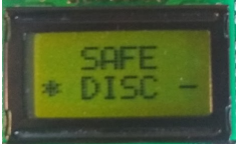

### Controller Design: Specifications

* The _SAFE_ and _READY_ conditions are controlled by the Stop/Safe-Ready slide switch in the center of the safety controls. By its design, the switch will be in one condition or the other and both cannot be true at the same time.
* When the system is in _SAFE_ mode the motor will be disconnected and the READY/WARNING green LED (Pin 41) will be constantly illuminated.
* To enter _READY_ mode, the system must be in _SAFE_ mode and the slide switch must change from Stop/Safe to Ready.  The _READY_ mode cannot be entered if there is a fault (defined below). While in the _READY_ mode the READY/WARNING green LED (Pin 41) will flash indicating the system is in the ready mode.
* If the system is in _READY_ mode and user holds down both RUN (RUN1 and RUN2) buttons continuously for 2 seconds, the system will enter _RUNNING_ mode.  During those 2 seconds, the system will be in _WARNING_ mode which will be indicated by flashing the READY/WARNING red LED (Pin 39). 
* _WARNING_ mode will be terminated and the system will return to _READY_ mode if either RUN button is released before the 2 seconds has passed. 
* Once in _RUNNING_ mode, the RUN buttons can be released and the motor will stay connected. In running mode, RUN/FAULT blue LED (Pin 43) will be  be constantly illuminated.
* The relay is used to connect the power to the motor. The relay coil is only energized (on) when the system is in _RUNNING_ mode. 
* A fault is defined as a condition in which the safety shield limit switch is not closed (the safety shield has been lifted out of place) or the E-Stop button has been pressed.  
* A fault will cause the system to leave its current mode and enter _FAULT_ mode no matter what other mode the system was in.  In _FAULT_ mode the RUN/FAULT red LED (Pin 45) will be flashing RED. 
* The system can only go to _SAFE_ mode from _FAULT_ mode.  To enter _SAFE_ from _FAULT_, the cause of the fault must be cleared (close safety shield and release the E-stop button) and the Stop/Safe-Ready switch must be cycled from the Ready position to the Stop/Safe position.
* If the slider switch is moved to Stop/Safe at any time, the system will leave its current mode and go to _SAFE_ mode, except if there is a fault.  Moving the switch to Stop/Safe in _FAULT_ mode will not change the mode until the faults are cleared.
* Initially, the program starts in _FAULT_ mode regardless of the positions of the limit switch or the E-Stop button. It remains in this state until the system enters _SAFE_ mode as described below.

Indicator operations
* The SAFE and RUNNING LEDs are illuminated continuously when the system is in those modes.
* When in _READY_, _WARNING_ or _FAULT_ mode, the appropriate LED flashes at 2 Hz.
* The LCD display will be used to display the current state, the condition of the two run buttons, and whether the motor is connected or disconnected. The display format is given below. 
    * You will display the name of the current mode in the first row of the LCD panel.
    * You will display the status of the RUN1 button in the first column of the second row of the LCD panel. If the switch is pressed the display will show * if not pressed it will show -.
    * You will display the status of the RUN2 button in the last column of the second row of the LCD panel. If the switch is pressed the display will show * if not pressed it will show -.
    * If the relay is energized (the motor is connected) the LCD will display CONN in columns 2-5 of the second row. If the relay is not enegrized the LCD will display DISC in columns 2-5 of the second row.

Motor operation
* For this test of the safety system,  the H-bridge will output a continuous 2.5 Volts. The motor itself will be turned on or off solely by the relay. The direction the motor runs is not important to the demonstration of the safety system.

## Workstation

The motor has two safety devices.  A limit switch is used to sense the location of the safety shield. It is located at the back of the green printed circuit board near the MOTOR1 connector.  The emergency stop button is the mechanically latching big red button.  All of the switches, buttons and LEDs in the Safety Control Section are connected to the Arduino through the circuit board and the pin numbers for each of them can be found in the [hardware resource](../Week03_Implementation_Resources/Week03_Hardware_resource.ipynb#Arduino-Mega-Pin-Mapping-for-ME480-Workstation). Pressing the big red button a couple of times will illustrate what is meant by mechanically latching.

### Motor Inertia Module

You will be using the housing for the inertia without the mass itself or connecting it to the motor for this lab. Take the brass connector off of the shaft and then attach the housing to the rig using the two thumbscrews. Notice that the small bump on the housing contacts the shield limit switch when it is fully closed.

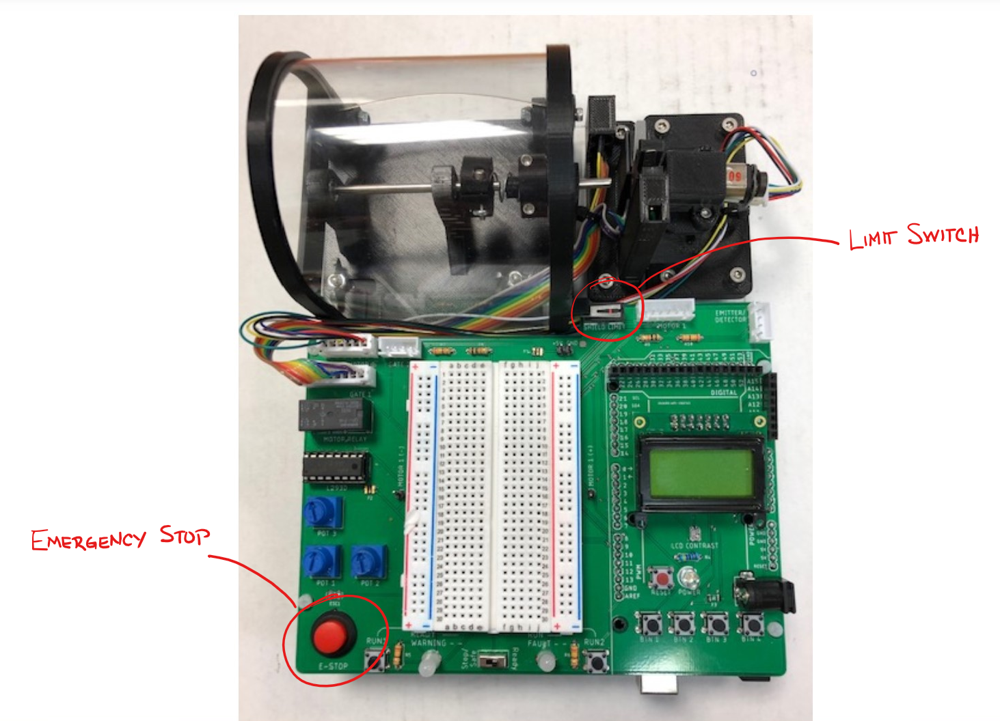

### H-Bridge 2

As you have seen from the first two labs, H-bridge circuits are useful when you want to amplify the current and control the direction of DC motors. As such, it makes sense that the components of an H-bridge are often packaged as a single electronic component. The L293D chip, located just below the relay (labeled [motor 2 driver](../Week03_Implementation_Resources/Week03_Hardware_resource.ipynb#ME-480-Portable-Workstation) on the workstation overview) is a more advanced H-bridge that we can use. Its internal circuit provides more protection from shorting than our Lab 1 circuit. To use this H-bridge you must disconnect the motor from the MOTOR 1 connector and move the wires to the MOTOR 2 connector. [Please be careful to grab on to the connector, and not the wires, when changing H-bridges](../Week03_Implementation_Resources/Week03_Hardware_resource.ipynb#CAUTION:-Do-NOT-pull-on-connector-wires). Once you have moved the connector you should remove your H-bridge circuit from the breadboard. The datasheet for the L293D can be found [here](https://www.ti.com/lit/ds/symlink/l293.pdf).

The connections to the L293D chip are part of the printed circuit board. The three pins that are used for control are MOTOR2_DIR1, MOTOR2_DIR2, and MOTOR2_PWM. Their operation is described further in the [hardware resource](../Week03_Implementation_Resources/Week03_Hardware_resource.ipynb##Motor-2-Driver:--L293D-H-Bridge-Chip). for this demonstration we will use the H-bridge to supply a continuous 2.5V voltage, available to power the motor, and use the relay to actually turn the motor on and off. You may rotate the motor either direction.

### Failsafe Relay

The same relay we used in lab 1 and 2 also connects the motor to the second H-bridge. So the same pin on the arduino will be used to control the relay to turn the motor on and off. 

A solid state switch, like a transistor, could have been used instead of a relay. However, in this case a relay is less expensive, dissipates less heat, and allowes us to easily run current in both directions through the motor. A relay was also an appropriate choice because it is not expected to switch at high frequencies or for a large number of cycles over its design life cycle in this application. The relay is also designed to fail in the open position, stopping the motor if it loses power.


## *Controller Design and Validation*: Workstation Safety System

* Develop a State Transition Diagram for this system
* Develop a State Transition Table for this system
* Using the four block structure, code a FSM program to run the motor on your rig according to the design specifications in Section 2.2. You may use tabs for subroutines, such as the timer, if you desire. 


**Place your STATE TRANSITITION DIAGRAM in the cell below.**

**Ensure the diagram and table are consistent with each other and they are both consistent wtih your final program**

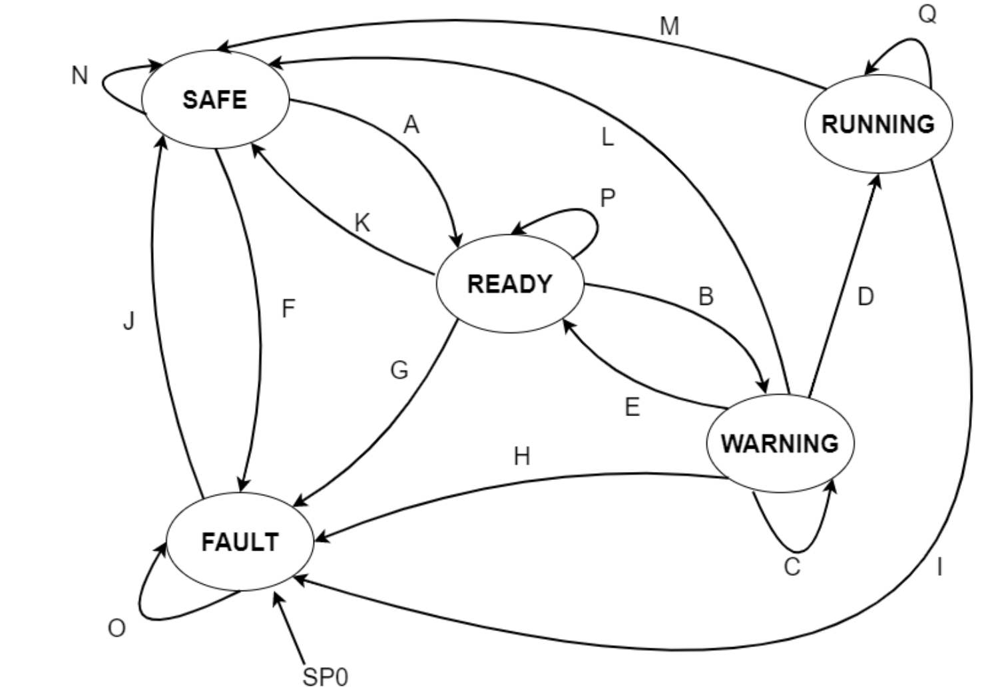

**Place your STATE TRANSITITION TABLE in the cell below.**

**Ensure the diagram and table are consistent with each other and they are both consistent wtih your final program**

NOTE: 

- when SWITCH = 0, the stop/safe/ready switch is in the ready position and when SWITCH = 1, the stop/safe/ready switch is in the stop/safe position
- all buttons and latches are 1 when they are pressed and 0 when they are not pressed


|Transition|Starting State|Transition Condition|Ending State|
|:---:|:---:|:---:|:---:|
|A|SAFE|$\overline{SWITCH}$|READY|
|B|READY|$RUN1\cdot RUN2$|WARNING|
|C|WARNING|$\overline{TMR1}$$\cdot RUN1\cdot RUN2\cdot$$\overline{SWITCH}\cdot$$\overline{ESTOP}$$\cdot SHIELD$|WARNING|
|D|WARNING|$TMR1\cdot$$RUN1\cdot$$RUN2$|RUNNING|
|E|WARNING|$\overline{TMR1}$$\cdot\overline{RUN1}$ + $\overline{TMR1}$$\cdot\overline{RUN2}$|READY|
|F|SAFE|$ESTOP$ + $\overline{SHIELD}$|FAULT|
|G|READY|$ESTOP$ + $\overline{SHIELD}$|FAULT|
|H|WARNING|$ESTOP$ + $\overline{SHIELD}$|FAULT|
|I|RUNNING|$ESTOP$ + $\overline{SHIELD}$|FAULT|
|J|FAULT|$\overline{ESTOP}$$\cdot SHIELD$$\cdot SWITCH$$\cdot\overline{SWITCH_{OLD}}$|SAFE|
|K|READY|$SWITCH\cdot$$\overline{ESTOP}$$\cdot SHIELD$|SAFE|
|L|WARNING|$SWITCH\cdot$$\overline{ESTOP}$$\cdot SHIELD$|SAFE|
|M|RUNNING|$SWITCH\cdot$$\overline{ESTOP}$$\cdot SHIELD$|SAFE|
|N|SAFE|$SWITCH\cdot$$\overline{ESTOP}$$\cdot SHIELD$|SAFE|
|O|FAULT|$ESTOP$ + $\overline{SHIELD}$ + $\overline{SWITCH}$ + $SWITCH_{OLD}$|FAULT|
|P|READY|$\overline{RUN1}$$\cdot\overline{ESTOP}$$\cdot SHIELD$$\cdot\overline{SWITCH}$ + $\overline{RUN2}$$\cdot\overline{ESTOP}$$\cdot SHIELD$$\cdot\overline{SWITCH}$|READY|
|Q|RUNNING|$\overline{ESTOP}$$\cdot SHIELD$$\cdot\overline{SWITCH}$|RUNNING|

***We will provide a script for you to follow to demonstrate your system. Please take a video of the demonstration and put a link to the video in the cell below***

https://photos.app.goo.gl/vhMXDqJPX3aRfs1K8

**Place your Arduino Code in the cell below.**

```javascript
//SSR_SWITCH represents the Stop/Safe/Ready switch connected to pin 23
//SHIELD_LIMIT represents the limit switch pressed when the safety shield is down connected to pin 5
//R1 represents the RUN1 button connected to pin 25
//R2 represents the RUN1 button connected to pin 25
//E_STOP represents the emergency stop button connected to pin 4
//RWG_LED represents the ready/warning green LED connected to pin 41
//RWR_LED represents the ready/warning green LED connected to pin 39
//RFB_LED represents the run/fault blue LED connected to pin 43
//RFR_LED represents the run/fault red LED connected to pin 45
//MOTOR_A represents motor 2 direction A connected to pin 6
//MOTOR_B represents motor 2 direction B connected to pin 7
//MOTOR_PWM represents motor 2 PWM connected to pin 8
//RELAY represents the motor relay connected to pin 37

//SWITCH represents the Stop/Safe/Ready switch reading (0 when in the ready position and 1 when in the safe/stop position)
//SHIELD represents the shield limit switch reading (0 when pressed and 1 when not pressed)
//RUN1 represents the RUN1 button reading (0 when pressed and 1 when not pressed)
//RUN2 represents the RUN1 button reading (0 when pressed and 1 when not pressed)
//ESTOP represents the emergency stop button reading (0 when pressed and 1 when not pressed)

//SAFE represents the safe state
//FAULT represents the fault state
//READY represents the ready state
//WARNING represents the warning state
//RUNNING represents the running state

//safeToReady represents the transition from the safe to ready state
//readyToWarning represents the transition from the ready to the warning state
//warningLatch represents the latch on the warning state
//warningToRunning represents the transition from the warning to the running state
//warningToReady represents the transition from the warning to the ready state
//safeToFault represents the transition from the safe to the fault state
//readyToFault represents the transition from the ready to the fault state
//warningToFault represents the transition from the warning to the fault state
//runningToFault represents the transition from the running to the fault state
//faultToSafe represents the transition from the fault to the safe state
//readyToSafe represents the transition from the ready to the safe state
//warningToSafe represents the transition from the warning to the safe state
//runningToSafe represents the transition from the running to the safe state
//safeLatch represents the latch on the safe state
//faultLatch represents the latch on the fault state
//readyLatch represents the latch on the ready state
//runningLatch represents the latch on the running state

//TMR1 represents the timer and will return true if the time duration is exceeded
//SWITCH_OLD represents the last state of the stop/safe/ready switch
//ledState represents the state of the LED
//previousMillis represents the last time LED was updated
//interval represents the interval at which to blink the LED (milliseconds)

#include <LiquidCrystal.h> //include LCD library

//initializing input and output pins
const int SSR_SWITCH = 23;
const int SHIELD_LIMIT = 5;
const int R1 = 25;
const int R2 = 27;
const int E_STOP = 4;
const int RWG_LED = 41;
const int RWR_LED = 39;
const int RFB_LED = 43;
const int RFR_LED = 45;
const int MOTOR2_A = 6;
const int MOTOR2_B = 7;
const int MOTOR2_PWM = 8;
const int RELAY = 37;

// Pin numbers for LDC display
int lcd_rs_pin = 14;
int lcd_en_pin = 15;
int lcd_db4_pin = 16;
int lcd_db5_pin = 17;
int lcd_db6_pin = 18;
int lcd_db7_pin = 19;

//initializing states
bool SAFE = false;
bool FAULT = true;
bool READY = false;
bool WARNING = false;
bool RUNNING = false;

// initializing transitions
bool safeToReady = false;
bool readyToWarning = false;
bool warningLatch = false;
bool warningToRunning = false;
bool warningToReady = false;
bool safeToFault = false;
bool readyToFault = false;
bool warningToFault = false;
bool runningToFault = false;
bool faultToSafe = false;
bool readyToSafe = false;
bool warningToSafe = false;
bool runningToSafe = false;
bool safeLatch = false;
bool faultLatch = false;
bool readyLatch = false;
bool runningLatch = false;

// initializing miscellaneous variables
bool TMR1 = false;
bool SWITCH_OLD = true;
int ledState = LOW;
unsigned long previousMillis = 0;
const long interval = 500;

LiquidCrystal LCD(lcd_rs_pin, lcd_en_pin, lcd_db4_pin, lcd_db5_pin, lcd_db6_pin, lcd_db7_pin);

void setup() {
  LCD.begin(8, 2); // initialize LCD
  Serial.begin(9600); //initialize serial communication
  pinMode(SSR_SWITCH, INPUT);
  pinMode(SHIELD_LIMIT, INPUT_PULLUP);
  pinMode(R1, INPUT_PULLUP);
  pinMode(R2, INPUT_PULLUP);
  pinMode(E_STOP, INPUT_PULLUP);
  pinMode(RWG_LED, OUTPUT);
  pinMode(RWR_LED, OUTPUT);
  pinMode(RFB_LED, OUTPUT);
  pinMode(RFR_LED, OUTPUT);
  pinMode(RELAY, OUTPUT);
}

void loop() {
  unsigned long currentMillis = millis(); //defining current time

  // BLOCK 1: Process Inputs
  //----------------------------------------
  int SWITCH = digitalRead(SSR_SWITCH);
  int SHIELD = !digitalRead(SHIELD_LIMIT); //negating so that this variable is 1 when pressed
  int RUN1 = !digitalRead(R1); //negating so that this variable is 1 when pressed
  int RUN2 = !digitalRead(R2); //negating so that this variable is 1 when pressed
  int ESTOP = !digitalRead(E_STOP); //negating so that this variable is 1 when pressed

  //call timer
  TMR1 = Timer(RUN1 && RUN2, 2000);

  // BLOCK 2: State Transition Logic
  //----------------------------------------
  safeToReady = SAFE && !SWITCH;
  readyToWarning = READY && RUN1 && RUN2;
  warningLatch = WARNING && !TMR1 && RUN1 && RUN2 && !SWITCH && !ESTOP && SHIELD;
  warningToRunning = WARNING && TMR1 && RUN1 && RUN2;
  warningToReady = WARNING && !TMR1 && !RUN1 || WARNING && !TMR1 && !RUN2;
  safeToFault = SAFE && ESTOP || SAFE && !SHIELD;
  readyToFault = READY && ESTOP || READY && !SHIELD;
  warningToFault = WARNING && ESTOP || WARNING && !SHIELD;
  runningToFault = RUNNING && ESTOP || RUNNING && !SHIELD;
  faultToSafe = FAULT && !ESTOP && SHIELD && SWITCH && !SWITCH_OLD;
  readyToSafe = READY && SWITCH && !ESTOP && SHIELD;
  warningToSafe = WARNING && SWITCH && !ESTOP && SHIELD;
  runningToSafe = RUNNING && SWITCH && !ESTOP && SHIELD;
  safeLatch = SAFE && SWITCH && !ESTOP && SHIELD;
  faultLatch = FAULT && ESTOP || FAULT && !SHIELD || FAULT && !SWITCH || FAULT && SWITCH_OLD;
  readyLatch = READY && !RUN1 && !ESTOP && SHIELD && !SWITCH || READY && !RUN2 && !ESTOP && SHIELD && !SWITCH;
  runningLatch = RUNNING && !ESTOP && SHIELD && !SWITCH;

  // BLOCK 3: Update States
  //----------------------------------------
  SAFE = faultToSafe || readyToSafe || warningToSafe || runningToSafe || safeLatch;
  FAULT = safeToFault || readyToFault || warningToFault || runningToFault || faultLatch;
  READY = safeToReady || warningToReady || readyLatch;
  WARNING = readyToWarning || warningLatch;
  RUNNING = warningToRunning || runningLatch;

  // BLOCK 4: Set Outputs and Old Variables
  //----------------------------------------

  if (SAFE == 1) {
    //motor disconnected
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED illuminated green
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RWG_LED, HIGH);

    // printing to LCD
    LCD.clear();
    LCD.print("SAFE");
    LCD.setCursor(2, 2);
    LCD.print("DISC");
  }

  if (FAULT == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //RUN/FAULT LED flashing red and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
    }
    if (ledState == LOW) {
      ledState = HIGH;
    } else {
      ledState = LOW;
    }
    digitalWrite(RWG_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RFR_LED, ledState);

    // printing to LCD
    LCD.clear();
    LCD.print("FAULT");
    LCD.setCursor(2, 2);
    LCD.print("DISC");
  }

  if (READY == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED flashing green and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
    }
    if (ledState == LOW) {
      ledState = HIGH;
    } else {
      ledState = LOW;
    }
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RWG_LED, ledState);

    //printing to LCD
    LCD.clear();
    LCD.print("READY");
    LCD.setCursor(2, 2);
    LCD.print("DISC");
  }

  if (WARNING == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED flashing red and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
    }
    if (ledState == LOW) {
      ledState = HIGH;
    } else {
      ledState = LOW;
    }
    digitalWrite(RWG_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RWR_LED, ledState);

    //printing to LCD
    LCD.clear();
    LCD.print("WARNING");
    LCD.setCursor(2, 2);
    LCD.print("DISC");
  }

  if (RUNNING == 1) {
    //motor connected
    digitalWrite(RELAY, HIGH);
    digitalWrite(MOTOR2_PWM, HIGH);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, HIGH);

    //RUN/FAULT LED illuminated blue
    digitalWrite(RWG_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RFB_LED, HIGH);

    //printing to LCD
    LCD.clear();
    LCD.print("RUNNING");
    LCD.setCursor(2, 2);
    LCD.print("CONN");
  }

  //checking if RUN1 or RUN2 is pressed and displaying to LCD
  if (RUN1 == 1) {
    LCD.setCursor(1, 2);
    LCD.print("*");
  } else {
    LCD.setCursor(1, 2);
    LCD.print("-");
  }
  if (RUN2 == 1) {
    LCD.setCursor(6, 2);
    LCD.print("*");
  } else {
    LCD.setCursor(6, 2);
    LCD.print("-");
  }
  // setting "old" switch state
  SWITCH_OLD = SWITCH;
  //delaying 200 ms so that the LCD screen does not flicker
  delay(200);
}

//------------------------------------------------------------------------
// TIMER
//------------------------------------------------------------------------

//TMR1_waiting represents the waiting state
//TMR1_timing represents the timing state

//TMR1_elapsed represents the elapsed time
//TMR1_starttime represents the start of the timing
//TMR1_duration represents the maximum time duration (in this case it is 2 seconds)

//TMRwaitToTime represents the transition from the wait to the timing state
//TMRwaitLatch represents the latch on the waiting state
//TMRtimeToWait represents the transition from the timing to the wait state
//TMRtimeLatch represents the latch on the timing state

boolean TMR1_waiting = true; 
boolean TMR1_timing = false; 
int TMR1_elapsed = 0; 
int TMR1_starttime = millis(); 

bool TMRwaitToTime = false;
bool TMRwaitLatch = false;
bool TMRtimeToWait = false;
bool TMRtimeLatch = false;

bool Timer(bool TMR1_enable, int TMR1_duration) {

  // BLOCK 2: State Transition Logic
  //----------------------------------------
  TMRwaitToTime = TMR1_waiting && TMR1_enable;
  TMRwaitLatch = TMR1_waiting && !TMR1_enable;
  TMRtimeToWait = TMR1_timing && !TMR1_enable || TMR1;
  TMRtimeLatch = TMR1_timing && TMR1_enable && !TMR1;

  // BLOCK 3: Update States
  //----------------------------------------
  TMR1_waiting = TMRwaitLatch || TMRtimeToWait;
  TMR1_timing = TMRwaitToTime || TMRtimeLatch;

  // BLOCK 4: Set Outputs and Old Variables
  //----------------------------------------
  if (TMR1_waiting == 1 ) { // if in waiting state
    TMR1_starttime = millis();
  }
  TMR1_elapsed = millis() - TMR1_starttime; // calculating elapsed time

  if (TMR1_elapsed >= TMR1_duration) { // if the elapsed time is longer than timer duration
    TMR1 = true; 
  }
  if (TMR1_elapsed < TMR1_duration) { // if the elapsed time is less than timer duration
    TMR1 = false;
  }

  return TMR1;
}
```